# Traffic Data Analysis

This notebook explores the traffic data we have collected. This aims to form the base of our research, extract knowledge from the data, and crucially provide generalised guidance on the formulation of our ML models.

For our purposes, we will focus on one venue (Etihad) and one related sensor (drakewell-1163). As our data set is very large, we will investigate patterns from this combination, allowing us to generalise these findings to our whole data set.

An overview of sections covered in this notebook:

1. **Setup and Data Extraction** – Connect to InfluxDB and query event/traffic data
2. **Exploratory Data Analysis** – Visualize data trends, distributions, and aid decision-making
3. **Correlation with Events** – Analyze how events (e.g., at Etihad) impact traffic
4. **Speed vs. Traffic Count Analysis** – Compare speed metrics against traffic congestion


## 1. Setup and Data Extraction

We first import the required libraries, set up the connection to InfluxDB, and perform basic Traffic and Event data queries.

In [1]:
from influxdb_client import InfluxDBClient
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter
import seaborn as sns
import ast
import geopandas as gpd
from shapely.geometry import Point
import contextily as ctx
import matplotlib.gridspec as gridspec
from tools.config import INFLUXDB_URL, INFLUXDB_ORG, INFLUXDB_TOKEN

# Connect to InfluxDB
client = InfluxDBClient(url=INFLUXDB_URL, token=INFLUXDB_TOKEN, org=INFLUXDB_ORG)
query_api = client.query_api()

### Querying Event Data

We query event data for a specific venue. In this example, we focus on events at **Etihad**.

In [2]:
# Query event data for a specific venue
venue = 'Etihad'
event_query = f"""
from(bucket:"manchester-i")
  |> range(start:-365d)
  |> filter(fn: (r) => r._measurement == "Event" and r.venue == "{venue}")
  |> pivot(rowKey:["_time"], columnKey: ["_field"], valueColumn: "_value")
"""
event_data = query_api.query_data_frame(event_query)

event_data['_time'] = pd.to_datetime(event_data['_time'])
event_data.set_index('_time', inplace=True)

event_data.head()

,result,table,_start,_stop,_measurement,event_name,event_type,location,venue,estimated_attendance
_time,,,,,,,,,,
2024-09-22 15:30:00+00:00,_result,0,2024-03-13 12:58:47.897696+00:00,2025-03-13 12:58:47.897696+00:00,Event,Arsenal @ Man City,match,"[53.483056, -2.200278]",Etihad,55000
2024-03-31 15:30:00+00:00,_result,1,2024-03-13 12:58:47.897696+00:00,2025-03-13 12:58:47.897696+00:00,Event,Arsenal @ Manchester City,match,"[53.483056, -2.200278]",Etihad,54000
2024-04-03 19:15:00+00:00,_result,2,2024-03-13 12:58:47.897696+00:00,2025-03-13 12:58:47.897696+00:00,Event,Aston Villa @ Manchester City,match,"[53.483056, -2.200278]",Etihad,53000
2024-09-14 14:00:00+00:00,_result,3,2024-03-13 12:58:47.897696+00:00,2025-03-13 12:58:47.897696+00:00,Event,Brentford @ Man City,match,"[53.483056, -2.200278]",Etihad,53000
2025-01-25 17:30:00+00:00,_result,4,2024-03-13 12:58:47.897696+00:00,2025-03-13 12:58:47.897696+00:00,Event,Chelsea @ Man City,match,"[53.483056, -2.200278]",Etihad,53000


### Querying Traffic Data

Next, we query traffic data from a specific sensor/platform. In this case, we filter for records with the platform ID `drakewell__1163` and sensor ID `avgspeed_nw`.

In [3]:
traffic_source = 'drakewell-1163'
traffic_query = f"""
from(bucket:"manchester-i")
  |> range(start:-365d)
  |> filter(fn: (r) => r._measurement == "Traffic" and r.platform_id == "drakewell__1163")
  |> pivot(rowKey:["_time"], columnKey: ["_field"], valueColumn: "_value")
"""
traffic_data = query_api.query_data_frame(traffic_query)

traffic_data['_time'] = pd.to_datetime(traffic_data['_time'])
traffic_data.set_index('_time', inplace=True)

traffic_data.head()

,result,table,_start,_stop,_measurement,location,platform_description,platform_id,platform_label,sensor_id,sensor_type,unit,value
_time,,,,,,,,,,,,,
2024-03-13 13:00:00+00:00,_result,0,2024-03-13 12:58:50.746662+00:00,2025-03-13 12:58:50.746662+00:00,Traffic,"[-2.19864, 53.4868]",Automatic Traffic Counter,drakewell__1163,Drakewell 1163,artic_nw,vehicle-count,count,0.0
2024-03-13 13:05:00+00:00,_result,0,2024-03-13 12:58:50.746662+00:00,2025-03-13 12:58:50.746662+00:00,Traffic,"[-2.19864, 53.4868]",Automatic Traffic Counter,drakewell__1163,Drakewell 1163,artic_nw,vehicle-count,count,0.0
2024-03-13 13:10:00+00:00,_result,0,2024-03-13 12:58:50.746662+00:00,2025-03-13 12:58:50.746662+00:00,Traffic,"[-2.19864, 53.4868]",Automatic Traffic Counter,drakewell__1163,Drakewell 1163,artic_nw,vehicle-count,count,0.0
2024-03-13 13:15:00+00:00,_result,0,2024-03-13 12:58:50.746662+00:00,2025-03-13 12:58:50.746662+00:00,Traffic,"[-2.19864, 53.4868]",Automatic Traffic Counter,drakewell__1163,Drakewell 1163,artic_nw,vehicle-count,count,2.0
2024-03-13 13:20:00+00:00,_result,0,2024-03-13 12:58:50.746662+00:00,2025-03-13 12:58:50.746662+00:00,Traffic,"[-2.19864, 53.4868]",Automatic Traffic Counter,drakewell__1163,Drakewell 1163,artic_nw,vehicle-count,count,0.0


In [4]:
# Convert speed from kph to mph
traffic_data.loc[traffic_data["sensor_type"] == "vehicle-speed", "value"] *= 0.621371

# Split the data
count_data = traffic_data[traffic_data["sensor_type"] == "vehicle-count"]
speed_data = traffic_data[traffic_data["sensor_type"] == "vehicle-speed"]

## 2. Exploratory Data Analysis - Traffic

In this section, we start by visualizing the traffic data:

- **Sensor & Venue Locations**: Map plots of all our traffic sensors and event venues.
- **General Traffic Data Overview**: Time-series plots of counts and speeds, conclusions on data quality and choices, and preprocessing steps.
- **Distribution Plots**: Histograms and boxplots for traffic counts and speeds, further confirmation of data quality.
- **Heatmaps**: To observe traffic intensity by time of day or day of week, comparison of traffic counts and speeds.

### Sensor & Venue Locations

We start by plotting a map of the traffic sensor and event locations. This can help visualize the spatial distribution of data points.

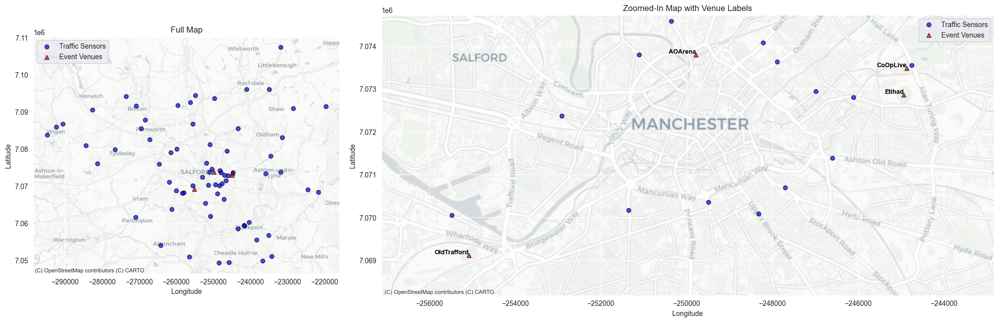

In [22]:
# Query unique venues
event_query = f'''
from(bucket: "manchester-i")
  |> range(start: -365d)
  |> filter(fn: (r) => r._measurement == "Event")
  |> distinct(column: "location")
'''
event_results = query_api.query(event_query)

event_locs = []
event_names = []
for table in event_results:
    for record in table.records:
        lon, lat = ast.literal_eval(record.values["location"])
        point = Point(lat, lon)
        if point not in event_locs:
            event_locs.append(point)
            event_names.append(record.values["venue"])

# Query unique sensor location
traffic_query = f'''
from(bucket: "manchester-i")
  |> range(start: -365d)
  |> filter(fn: (r) => r._measurement == "Traffic")
  |> distinct(column: "location")
'''
traffic_results = query_api.query(traffic_query)

sensor_locs = []
for table in traffic_results:
    for record in table.records:
        lon, lat = ast.literal_eval(record.values["location"])
        point = Point(lon, lat)
        if point not in sensor_locs:
            sensor_locs.append(point)

# Create map representation of data
event_gdf = gpd.GeoDataFrame({'venue': event_names}, geometry=event_locs, crs="EPSG:4326")
sensor_gdf = gpd.GeoDataFrame(geometry=sensor_locs, crs="EPSG:4326")

event_gdf = event_gdf.to_crs(epsg=3857)
sensor_gdf = sensor_gdf.to_crs(epsg=3857)

# Plots
fig = plt.figure(figsize=(20, 10))
gs = gridspec.GridSpec(1, 2, width_ratios=[1, 2])

ax_full = fig.add_subplot(gs[0])
ax_zoom = fig.add_subplot(gs[1])

sensor_gdf.plot(ax=ax_full, marker='o', color='blue', label='Traffic Sensors',
                alpha=0.7, edgecolor='k')
event_gdf.plot(ax=ax_full, marker='^', color='red', label='Event Venues',
               alpha=0.7, edgecolor='k')

ctx.add_basemap(ax_full, source=ctx.providers.CartoDB.Positron)
ax_full.set_title("Full Map")
ax_full.set_xlabel("Longitude")
ax_full.set_ylabel("Latitude")
ax_full.legend()

sensor_gdf.plot(ax=ax_zoom, marker='o', color='blue', label='Traffic Sensors',
                alpha=0.7, edgecolor='k')
event_gdf.plot(ax=ax_zoom, marker='^', color='red', label='Event Venues',
               alpha=0.7, edgecolor='k')

# Calculate the bounds of the event venues and add a margin
minx, miny, maxx, maxy = event_gdf.total_bounds
dx = (maxx - minx) * 0.2
dy = (maxy - miny) * 0.2
ax_zoom.set_xlim(minx - dx, maxx + dx)
ax_zoom.set_ylim(miny - dy, maxy + dy)

for idx, row in event_gdf.iterrows():
    x = row.geometry.x
    y = row.geometry.y
    venue_label = row['venue']
    ax_zoom.text(x, y, venue_label, fontsize=9, fontweight='bold',
                 color='black', ha='right', va='bottom')

ctx.add_basemap(ax_zoom, source=ctx.providers.CartoDB.Positron)
ax_zoom.set_title("Zoomed-In Map with Venue Labels")
ax_zoom.set_xlabel("Longitude")
ax_zoom.set_ylabel("Latitude")
ax_zoom.legend()

plt.tight_layout()
plt.show()


### General Traffic Data Overview & Preprocessing
There are two main types of sensors in the data: vehicle-count and vehicle-speed. We explore these below.


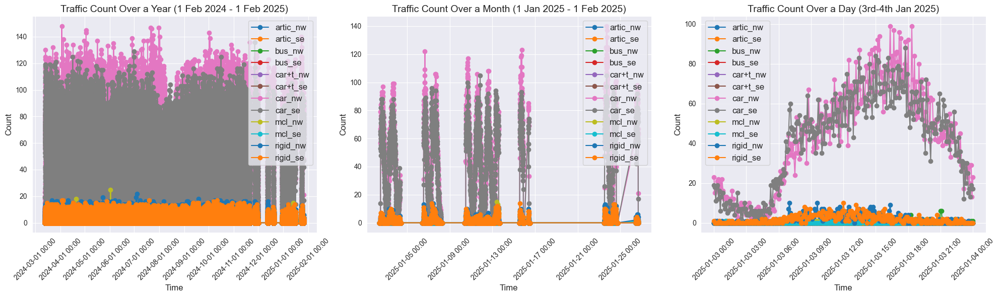

In [23]:
# Filter data for year, month and day visualisation windows
traffic_window_year = count_data[
    (count_data.index >= "2024-02-01 00:00:00+00:00") &
    (count_data.index <= "2025-02-01 00:00:00+00:00")
]

traffic_window_month = count_data[
    (count_data.index >= "2025-01-01 00:00:00+00:00") &
    (count_data.index <= "2025-02-01 00:00:00+00:00")
]

traffic_window_24 = count_data[
    (count_data.index >= "2025-01-03 00:00:00+00:00") &
    (count_data.index <= "2025-01-04 00:00:00+00:00")
]

fig, (ax0, ax1, ax2) = plt.subplots(ncols=3, nrows=1, figsize=(20, 6))

# Plot year window
for sensor, group in traffic_window_year.groupby('sensor_id'):
    ax0.plot(group.index, group['value'],
             label=sensor, marker='o', linewidth=1.5)
ax0.set_title('Traffic Count Over a Year (1 Feb 2024 - 1 Feb 2025)', fontsize=14)
ax0.set_xlabel('Time', fontsize=12)
ax0.set_ylabel('Count', fontsize=12)
ax0.legend(fontsize=12)
ax0.grid(True)
ax0.xaxis.set_major_formatter(DateFormatter("%Y-%m-%d %H:%M"))
ax0.tick_params(axis='x', rotation=45)

# Plot month window
for sensor, group in traffic_window_month.groupby('sensor_id'):
    ax1.plot(group.index, group['value'],
             label=sensor, marker='o', linewidth=1.5)
ax1.set_title('Traffic Count Over a Month (1 Jan 2025 - 1 Feb 2025)', fontsize=14)
ax1.set_xlabel('Time', fontsize=12)
ax1.set_ylabel('Count', fontsize=12)
ax1.legend(fontsize=12)
ax1.grid(True)
ax1.xaxis.set_major_formatter(DateFormatter("%Y-%m-%d %H:%M"))
ax1.tick_params(axis='x', rotation=45)

# Plot day window
for sensor, group in traffic_window_24.groupby('sensor_id'):
    ax2.plot(group.index, group['value'],
             label=sensor, marker='o', linewidth=1.5)
ax2.set_title('Traffic Count Over a Day (3rd-4th Jan 2025)', fontsize=14)
ax2.set_xlabel('Time', fontsize=12)
ax2.set_ylabel('Count', fontsize=12)
ax2.legend(fontsize=12)
ax2.grid(True)
ax2.xaxis.set_major_formatter(DateFormatter("%Y-%m-%d %H:%M"))
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


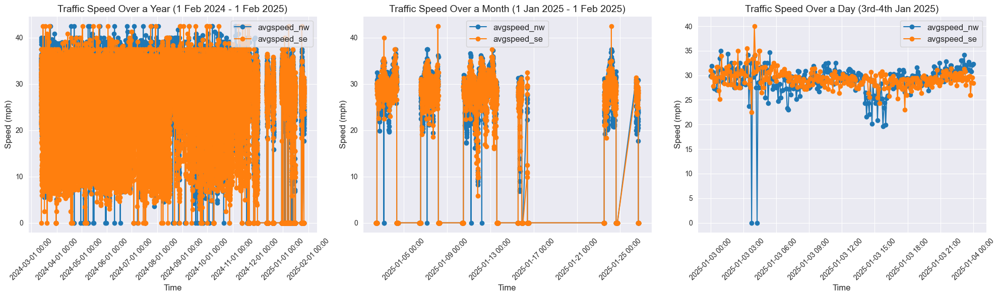

In [24]:
# Filter data for year, month and day visualisation windows
traffic_window_year = speed_data[
    (speed_data.index >= "2024-02-01 00:00:00+00:00") &
    (speed_data.index <= "2025-02-01 00:00:00+00:00")
]

traffic_window_month = speed_data[
    (speed_data.index >= "2025-01-01 00:00:00+00:00") &
    (speed_data.index <= "2025-02-01 00:00:00+00:00")
]

traffic_window_24 = speed_data[
    (speed_data.index >= "2025-01-03 00:00:00+00:00") &
    (speed_data.index <= "2025-01-04 00:00:00+00:00")
]

fig, (ax0, ax1, ax2) = plt.subplots(ncols=3, nrows=1, figsize=(20, 6))

# Plot year window
for sensor, group in traffic_window_year.groupby('sensor_id'):
    ax0.plot(group.index, group['value'],
             label=sensor, marker='o', linewidth=1.5)
ax0.set_title('Traffic Speed Over a Year (1 Feb 2024 - 1 Feb 2025)', fontsize=14)
ax0.set_xlabel('Time', fontsize=12)
ax0.set_ylabel('Speed (mph)', fontsize=12)
ax0.legend(fontsize=12)
ax0.grid(True)
ax0.xaxis.set_major_formatter(DateFormatter("%Y-%m-%d %H:%M"))
ax0.tick_params(axis='x', rotation=45)

# Plot month window
for sensor, group in traffic_window_month.groupby('sensor_id'):
    ax1.plot(group.index, group['value'],
             label=sensor, marker='o', linewidth=1.5)
ax1.set_title('Traffic Speed Over a Month (1 Jan 2025 - 1 Feb 2025)', fontsize=14)
ax1.set_xlabel('Time', fontsize=12)
ax1.set_ylabel('Speed (mph)', fontsize=12)
ax1.legend(fontsize=12)
ax1.grid(True)
ax1.xaxis.set_major_formatter(DateFormatter("%Y-%m-%d %H:%M"))
ax1.tick_params(axis='x', rotation=45)

# Plot day window
for sensor, group in traffic_window_24.groupby('sensor_id'):
    ax2.plot(group.index, group['value'],
             label=sensor, marker='o', linewidth=1.5)
ax2.set_title('Traffic Speed Over a Day (3rd-4th Jan 2025)', fontsize=14)
ax2.set_xlabel('Time', fontsize=12)
ax2.set_ylabel('Speed (mph)', fontsize=12)
ax2.legend(fontsize=12)
ax2.grid(True)
ax2.xaxis.set_major_formatter(DateFormatter("%Y-%m-%d %H:%M"))
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


From exploring this data, we take some conclusions.
- The data looks correct, with what we would expect from traffic data.
- There are some large missing pieces of data, even though these seem to be more recent, and we have clear, continuous data before this.
- The traffic speed data is clear and useful, having just two types, being the average speed in each direction of the road.
- For traffic count, however, this data is much more segregated, with counts subdivided by vehicle type. Looking at the data, and in fact the scope of this project, the most useful data here is the "car" counts, again in each direction.

Given this, we will focus solely on the "car" count and average speed for the rest of this analysis.

In terms of preprocessing, the two main issues with data are (as previously stated):
- Zero values in the speed data (may indicate a sensor malfunction or communication error)
- Missing data for long periods of time (may indicate long sensor malfunctions that require manual intervention)

We will therefore:
- Ignore chunks of missing data, by simply not using these chunks in our models. Interpolating this data was considered, however this would likely lead to incorrect data, as the missing chunks are large and not just a few missing points.
- Remove zero values from the speed data, as these are likely sensor errors. The count data does not have this issue, as zero counts are valid data points and the curves look generally correct, with no "sudden drops" as we see in the speeds.

In [25]:
# Preprocessing - removing zero values and reducing counts to only car counts
speed_data = speed_data[speed_data['value'] > 0]
count_data = count_data[count_data['sensor_id'].str.contains("car_")]

### Distribution Plots

Next, we visualize the distribution of traffic counts and speeds using histograms and boxplots, to spot general trends.

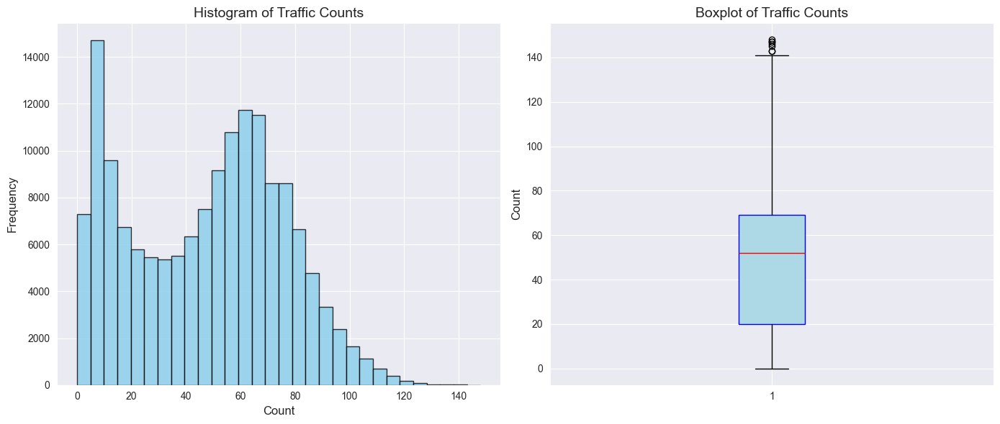

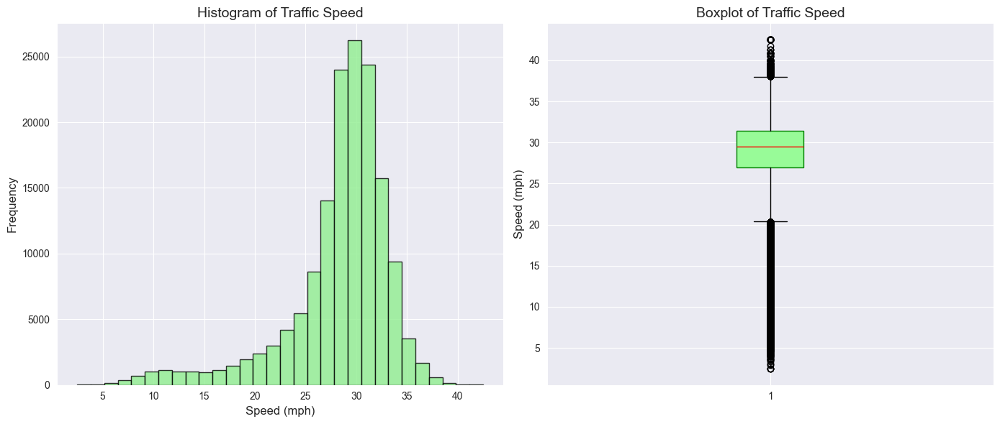

In [26]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 6))

# Histogram for traffic counts
ax1.hist(count_data['value'], bins=30, color='skyblue', edgecolor='black', alpha=0.8)
ax1.set_title('Histogram of Traffic Counts', fontsize=14)
ax1.set_xlabel('Count', fontsize=12)
ax1.set_ylabel('Frequency', fontsize=12)

# Boxplot for traffic counts
ax2.boxplot(count_data['value'], vert=True, patch_artist=True,
            boxprops=dict(facecolor='lightblue', color='blue'),
            medianprops=dict(color='red'))
ax2.set_title('Boxplot of Traffic Counts', fontsize=14)
ax2.set_ylabel('Count', fontsize=12)

plt.tight_layout()
plt.show()

fig, (ax3, ax4) = plt.subplots(ncols=2, figsize=(14, 6))

# Histogram for traffic speeds
ax3.hist(speed_data['value'], bins=30, color='lightgreen', edgecolor='black', alpha=0.8)
ax3.set_title('Histogram of Traffic Speed', fontsize=14)
ax3.set_xlabel('Speed (mph)', fontsize=12)
ax3.set_ylabel('Frequency', fontsize=12)

# Boxplot for traffic speeds
ax4.boxplot(speed_data['value'], vert=True, patch_artist=True,
            boxprops=dict(facecolor='palegreen', color='green'),
            medianprops=dict(color='red'))
ax4.set_title('Boxplot of Traffic Speed', fontsize=14)
ax4.set_ylabel('Speed (mph)', fontsize=12)

plt.tight_layout()
plt.show()


No large observations are made here.

The data is as expected, with the counts being generally low and the speeds being generally high. The boxplots show a few outliers, but these are not unexpected and are likely valid data points, as they are completely achievable speeds by cars, and counts are within the possibility of roads in manchester.

Since we have already applied the techniques talked about in the previous section, these plots confirm the techniques worked and show good data.

As a small side-note, we see further confirmation that the zero values in count data are correct as these are completely within the range of all other data points. We would see a much larger bucket of zero values if these were sensor errors.

### Heatmaps

We now create heatmaps to visualize traffic patterns by day of the week and hour of the day. This can help identify peak traffic times and days.

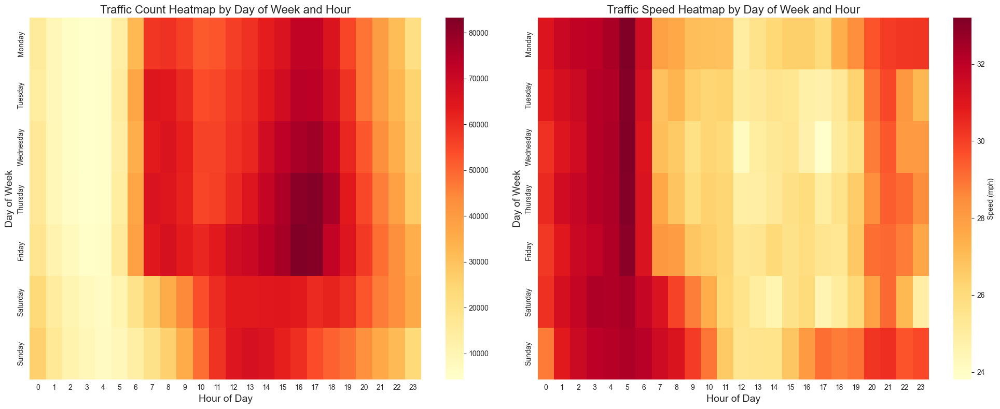

In [27]:
count_df = count_data.copy()
speed_df = speed_data.copy()

for df in [count_df, speed_df]:
    df['hour'] = df.index.hour
    df['day_of_week'] = df.index.dayofweek

# Aggregate the count data
heat_count = count_df.groupby(['day_of_week', 'hour'])['value'].sum().reset_index()
heat_count_pivot = heat_count.pivot(index='day_of_week', columns='hour', values='value')

# Aggregate the speed data
heat_speed = speed_df.groupby(['day_of_week', 'hour'])['value'].mean().reset_index()
heat_speed_pivot = heat_speed.pivot(index='day_of_week', columns='hour', values='value')

day_names = {0: "Monday", 1: "Tuesday", 2: "Wednesday", 3: "Thursday",
             4: "Friday", 5: "Saturday", 6: "Sunday"}
heat_count_pivot.index = heat_count_pivot.index.map(day_names)
heat_speed_pivot.index = heat_speed_pivot.index.map(day_names)

# Plot
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 8))

sns.heatmap(heat_count_pivot, annot=False, fmt=".1f", cmap="YlOrRd", ax=ax1)
ax1.set_title("Traffic Count Heatmap by Day of Week and Hour", fontsize=16)
ax1.set_xlabel("Hour of Day", fontsize=14)
ax1.set_ylabel("Day of Week", fontsize=14)

sns.heatmap(heat_speed_pivot, annot=False, fmt=".1f", cmap="YlOrRd", ax=ax2, cbar_kws={'label': 'Speed (mph)'})
ax2.set_title("Traffic Speed Heatmap by Day of Week and Hour", fontsize=16)
ax2.set_xlabel("Hour of Day", fontsize=14)
ax2.set_ylabel("Day of Week", fontsize=14)

plt.tight_layout()
plt.show()

The heatmaps show some interesting patterns:
- **Traffic Counts**: The highest counts are on weekdays during morning and evening rush hours, with lower counts on weekends.
- **Traffic Speed**: Speeds are generally higher during off-peak hours and weekends, with lower speeds during rush hours.

These patterns are consistent with typical traffic behavior in urban areas, providing further validation of the data quality.
We also observe that speed and count have an almost inverse relationship, with high counts having low speeds and vice versa. This is expected, and we will further analyse this in a later section.

## 3. Correlation with Events

This section examines the impact of events on traffic. For each event time (from the event data), we compare the traffic data in a 12-hour window before and after the event. We also analyze a similar time window for the next day to serve as a comparison.

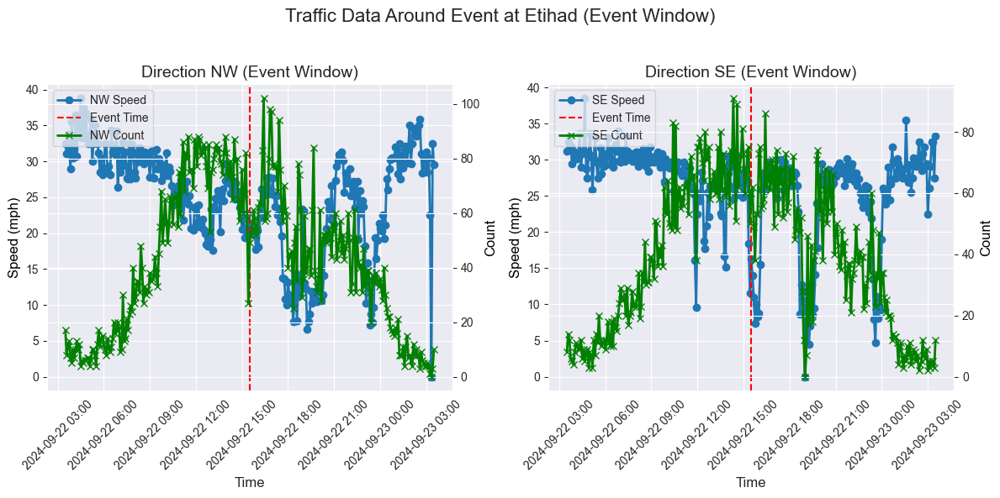

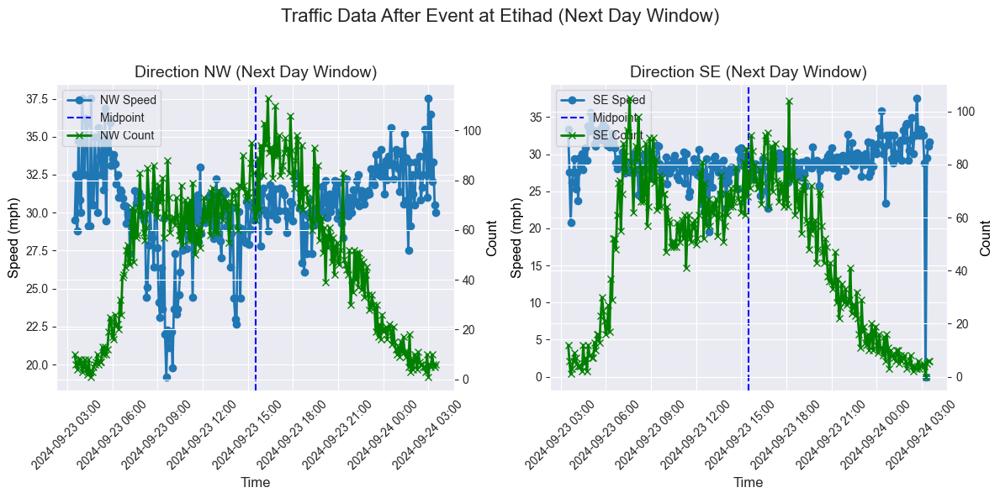

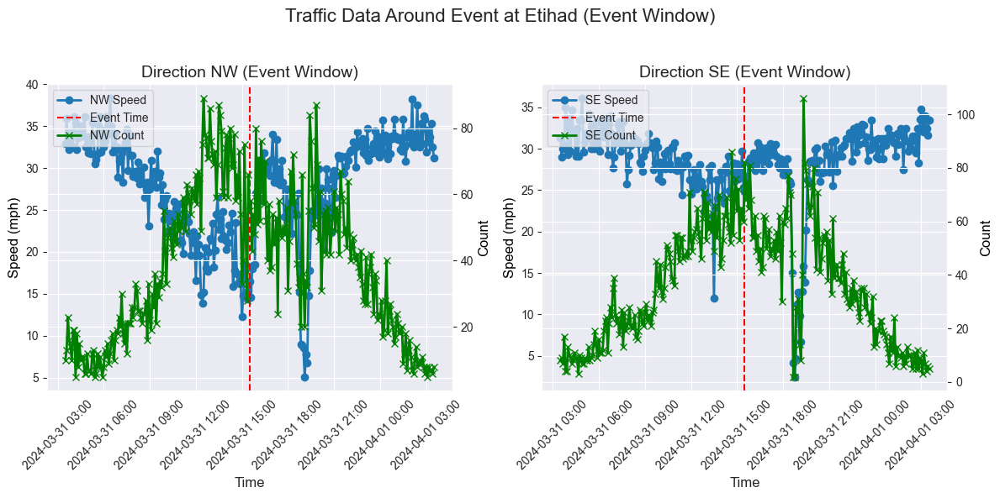

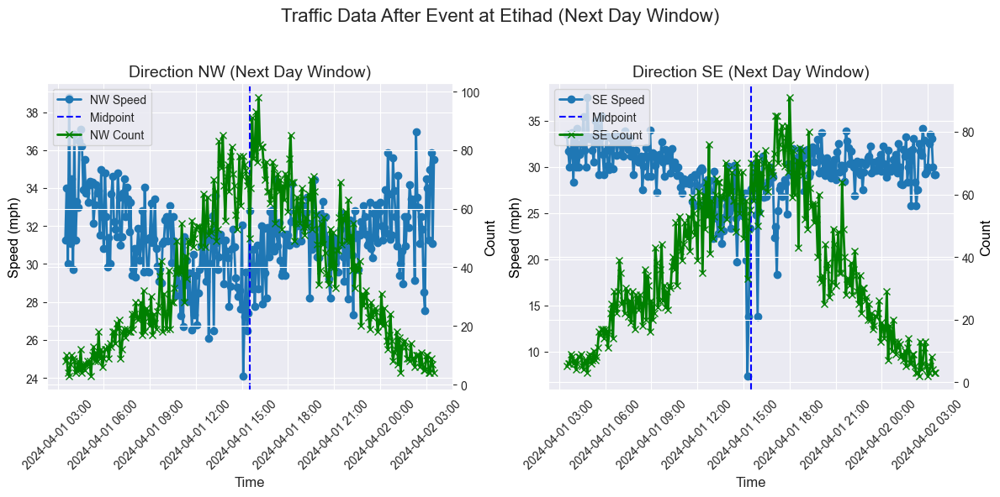

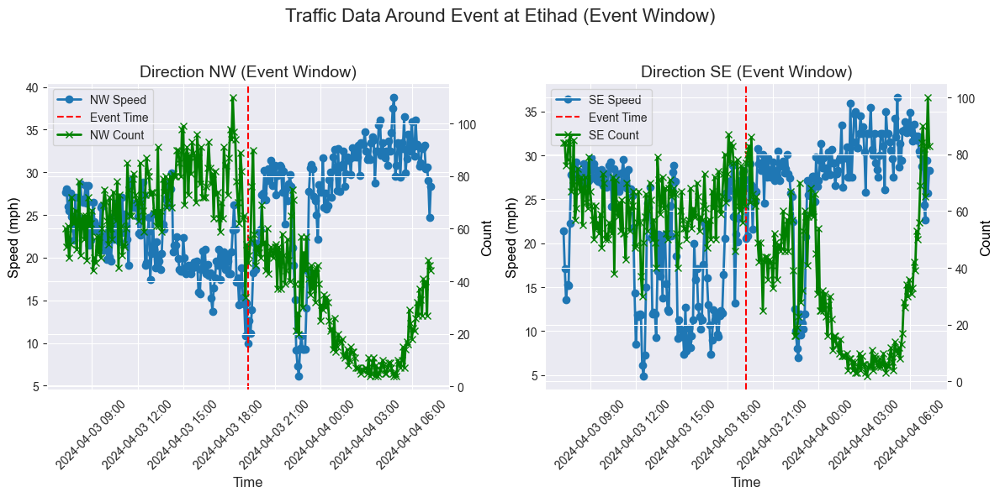

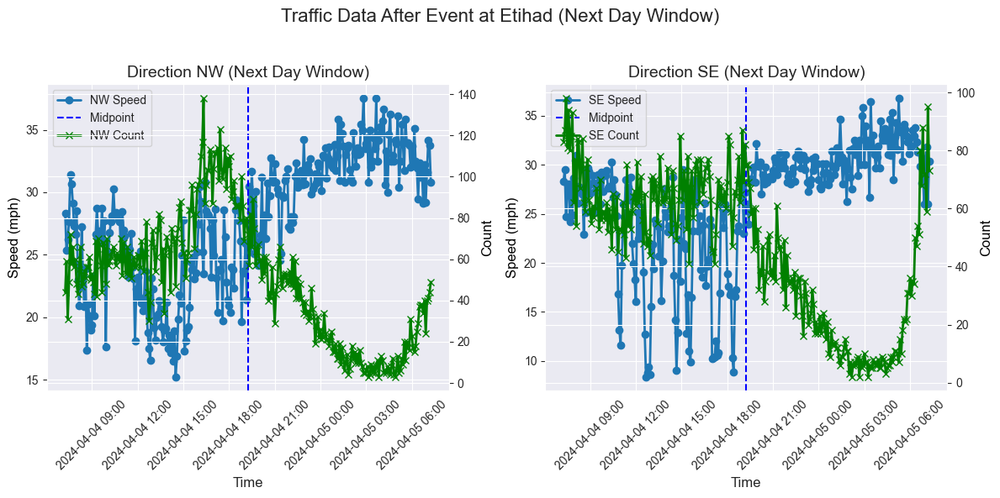

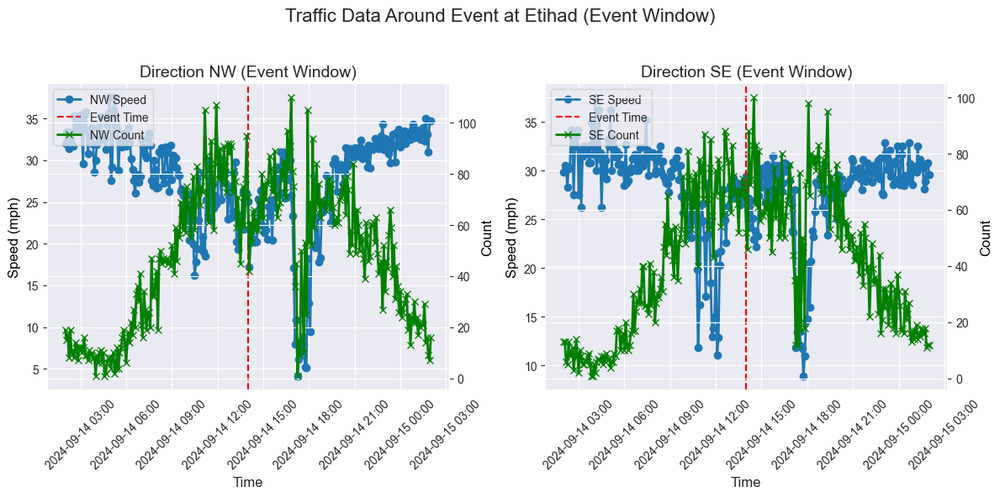

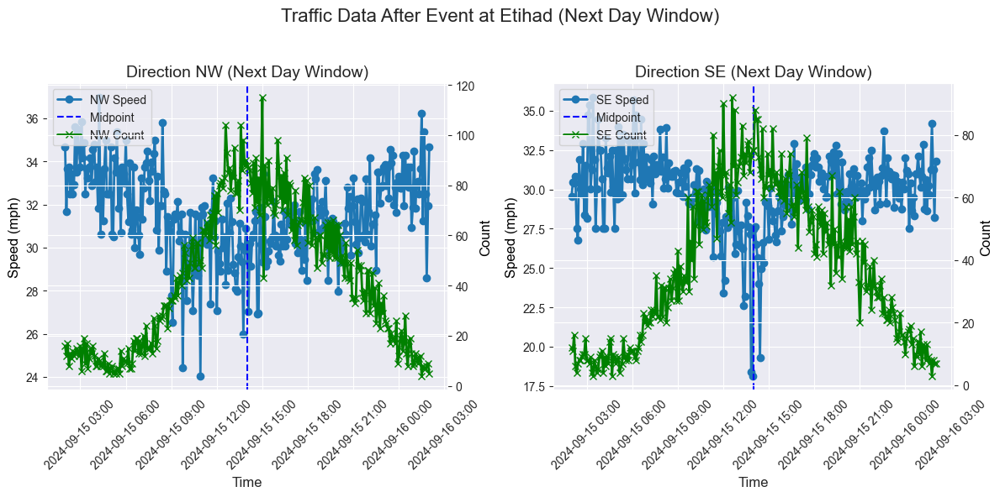

Skipping event at 2025-01-25 17:30:00+00:00 due to incomplete event window data.
Skipping event at 2024-12-26 12:30:00+00:00 due to incomplete event window data.
Skipping event at 2024-11-26 20:00:00+00:00 due to incomplete event window data.


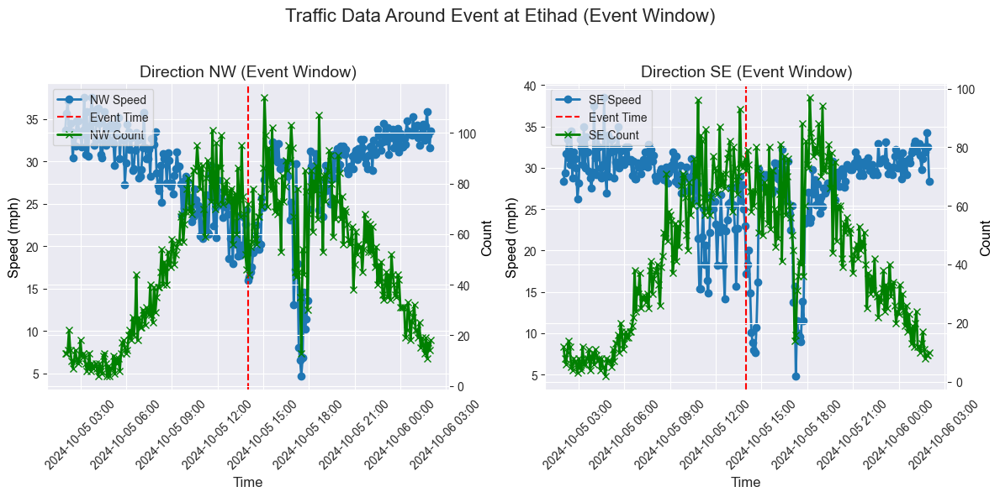

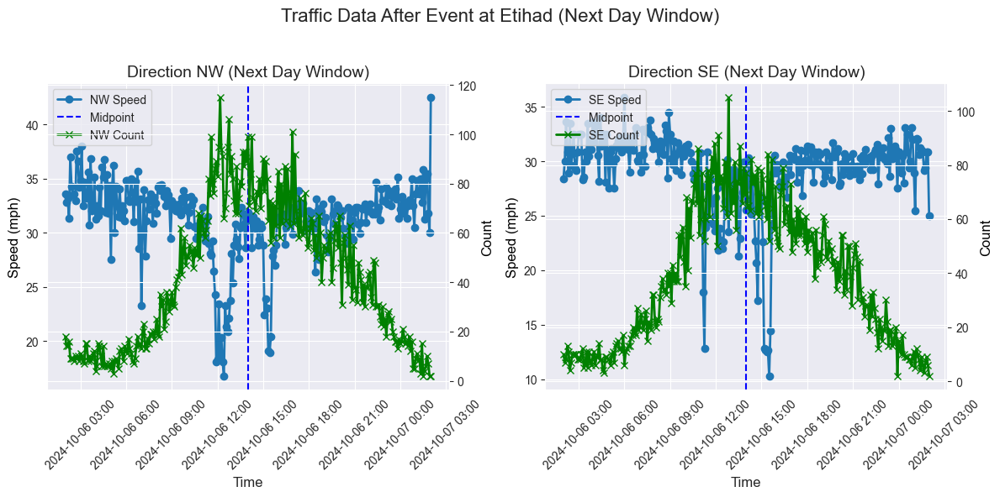

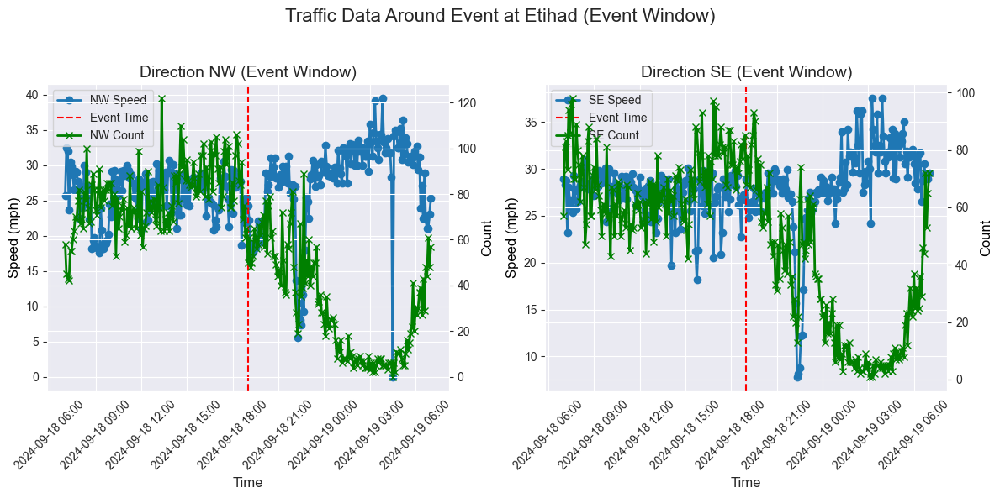

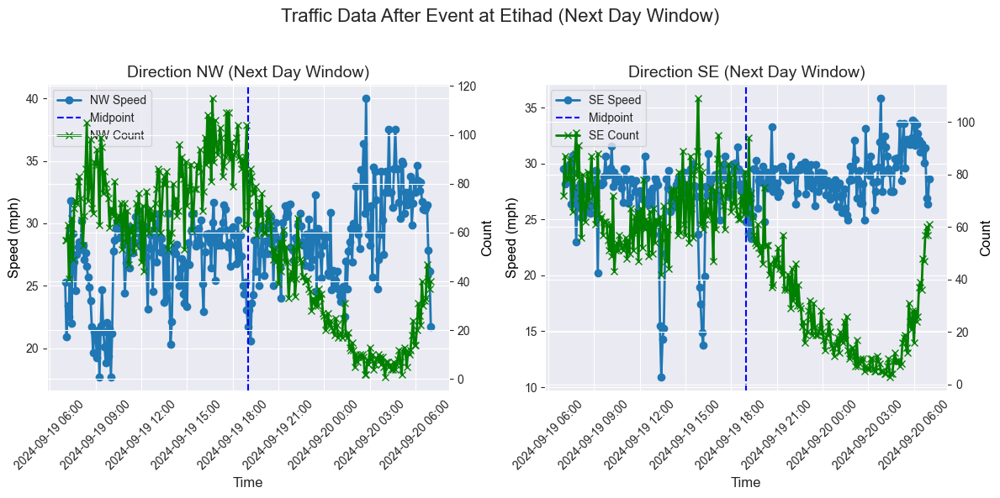

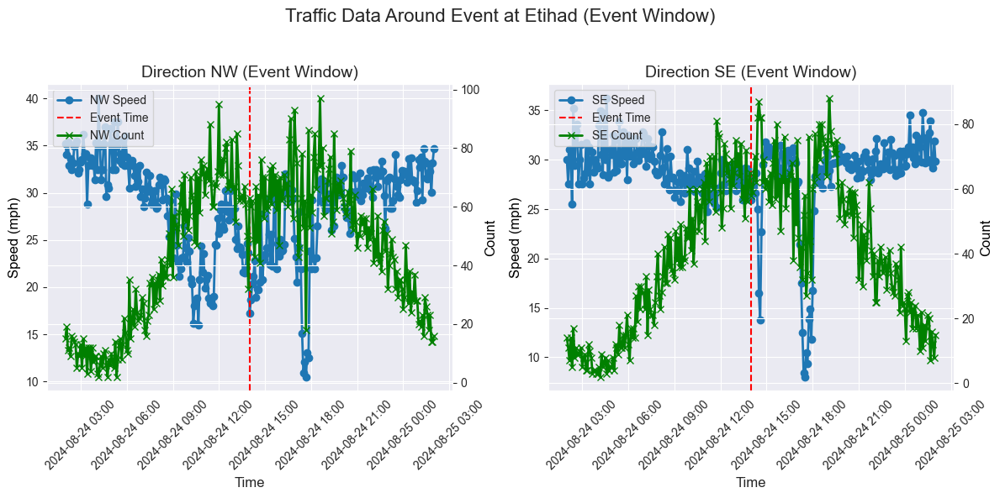

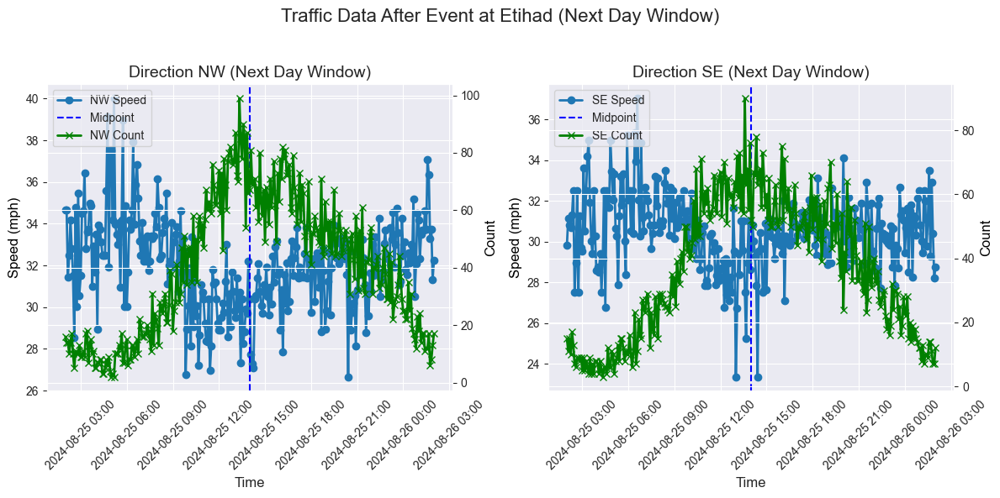

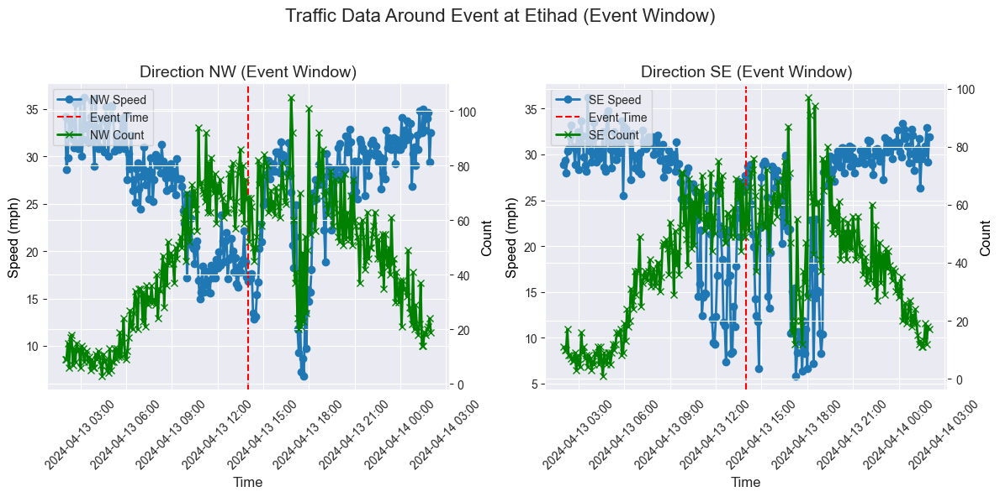

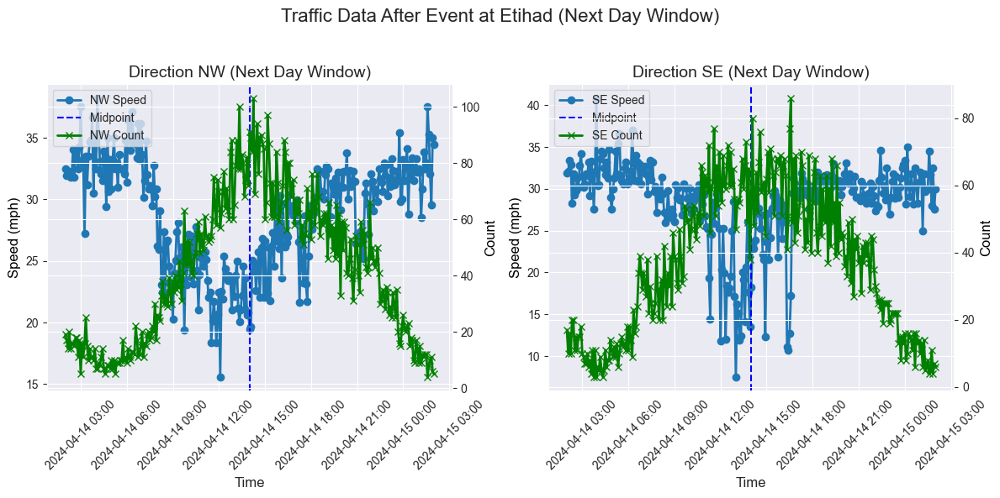

Skipping event at 2024-12-15 16:30:00+00:00 due to incomplete event window data.


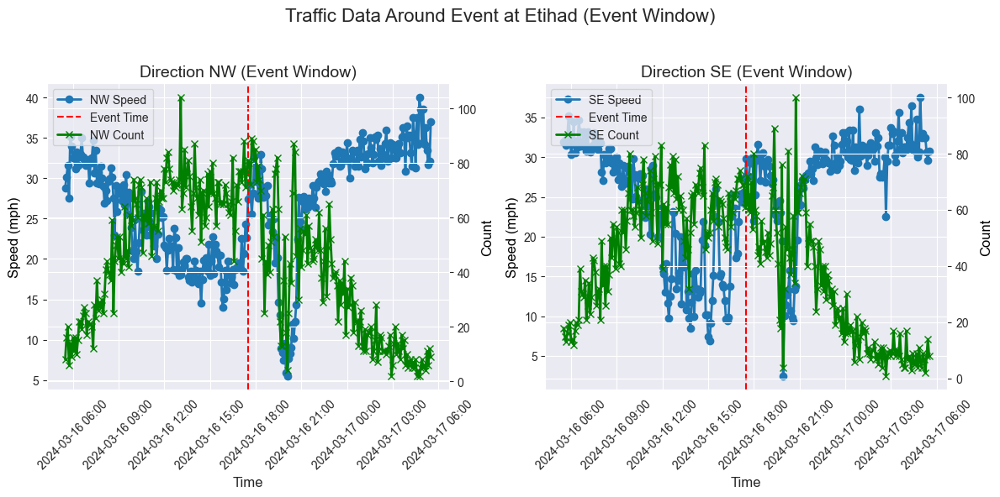

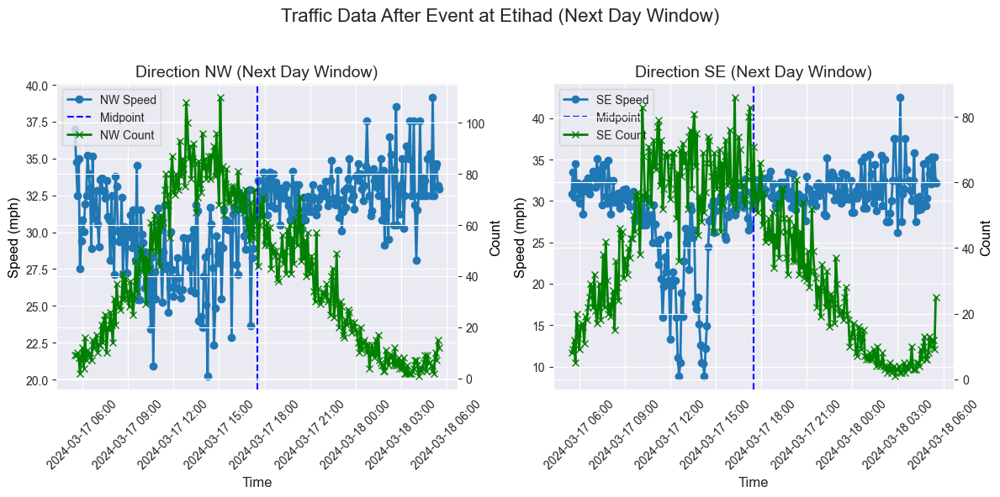

Skipping event at 2024-12-04 19:30:00+00:00 due to incomplete event window data.


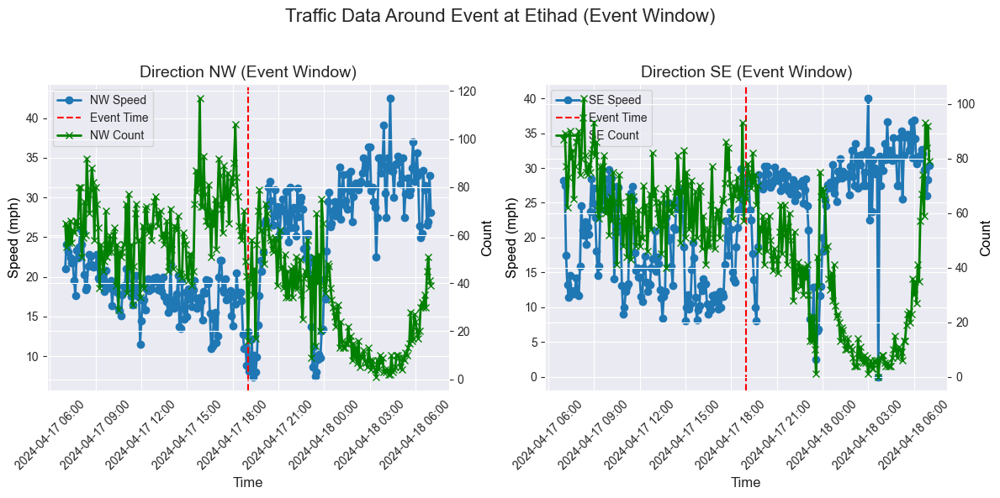

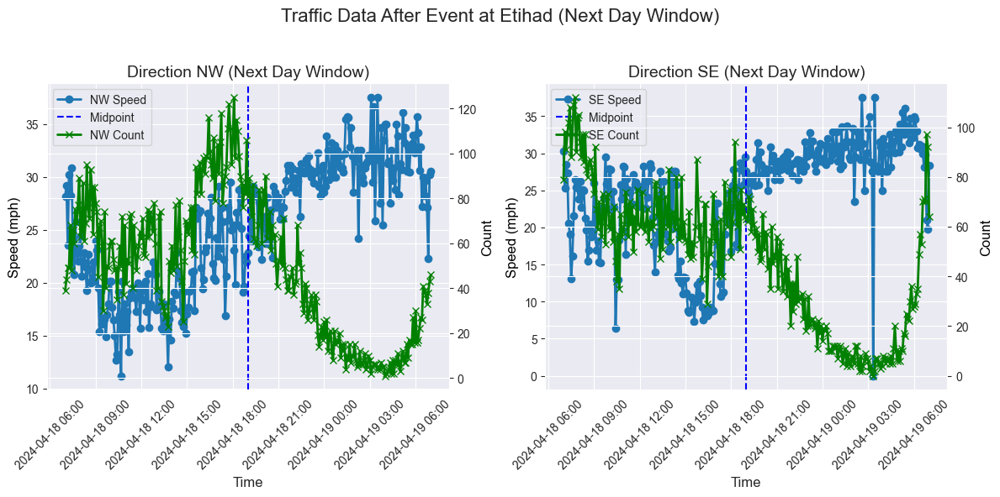

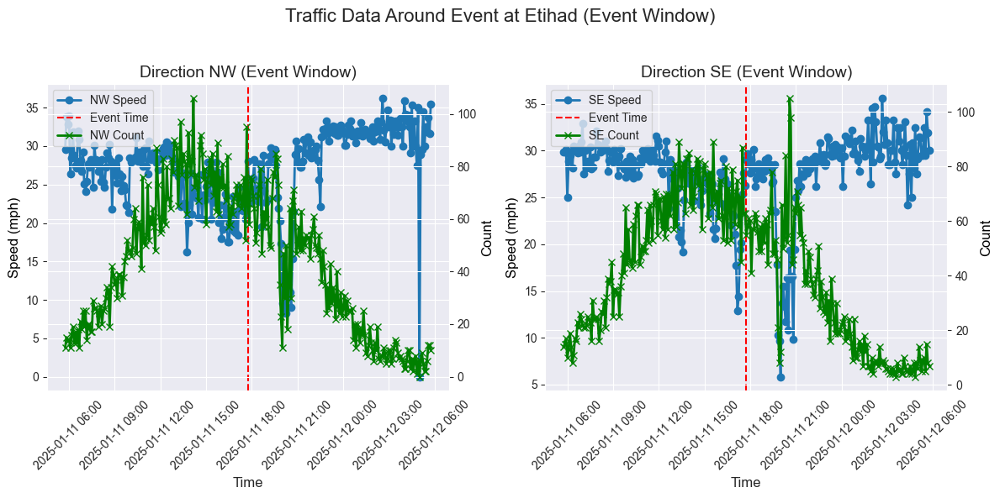

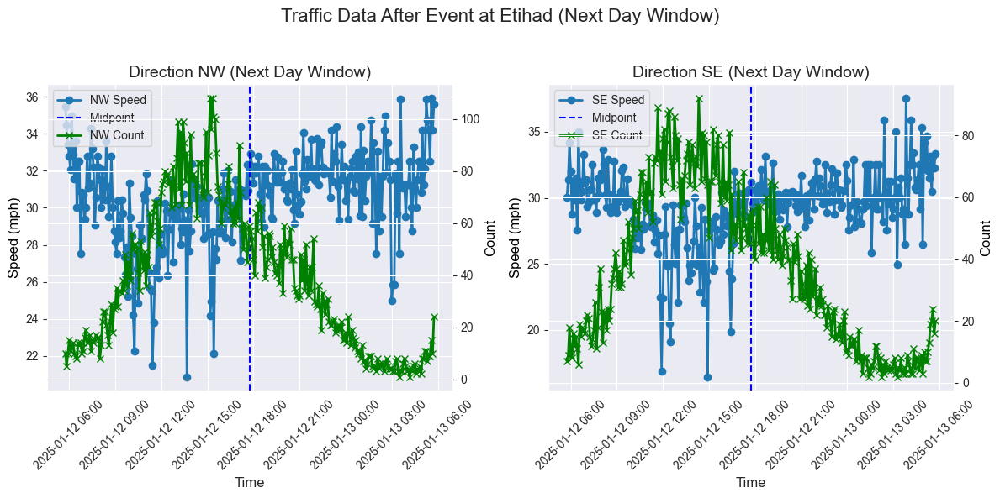

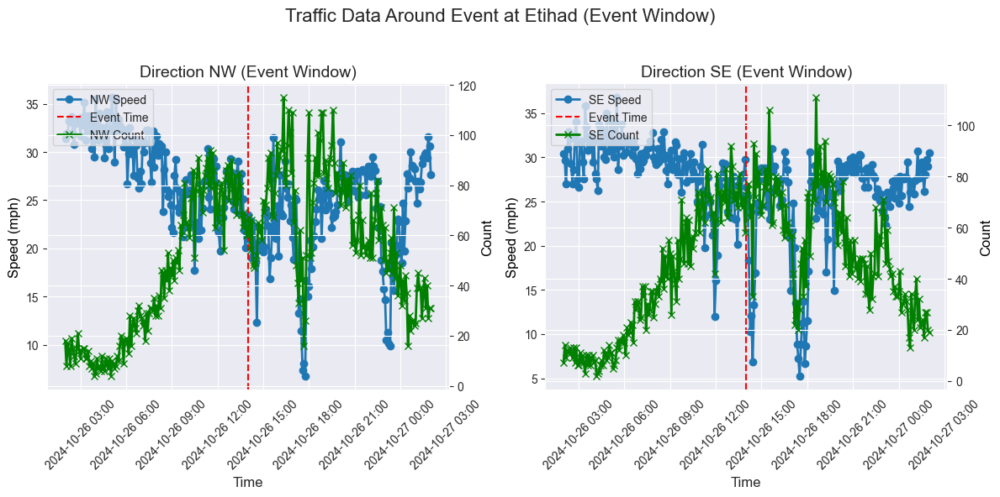

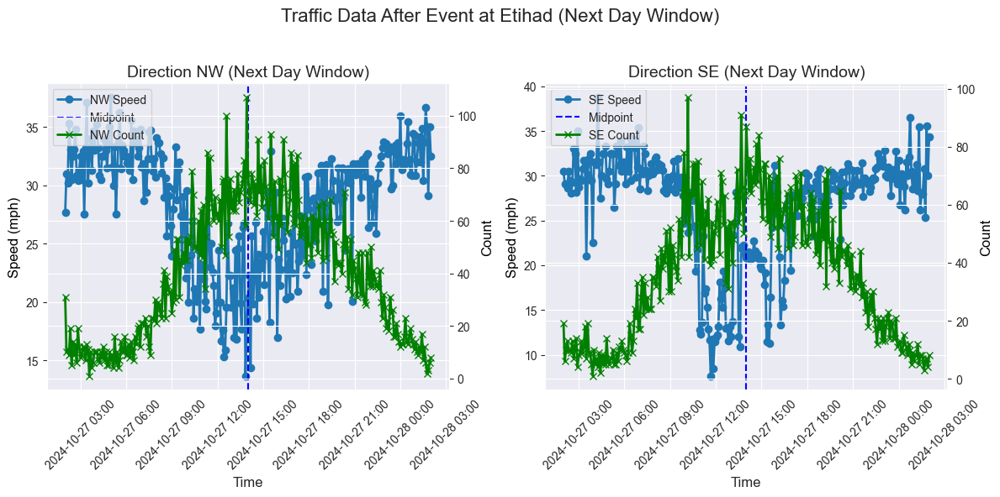

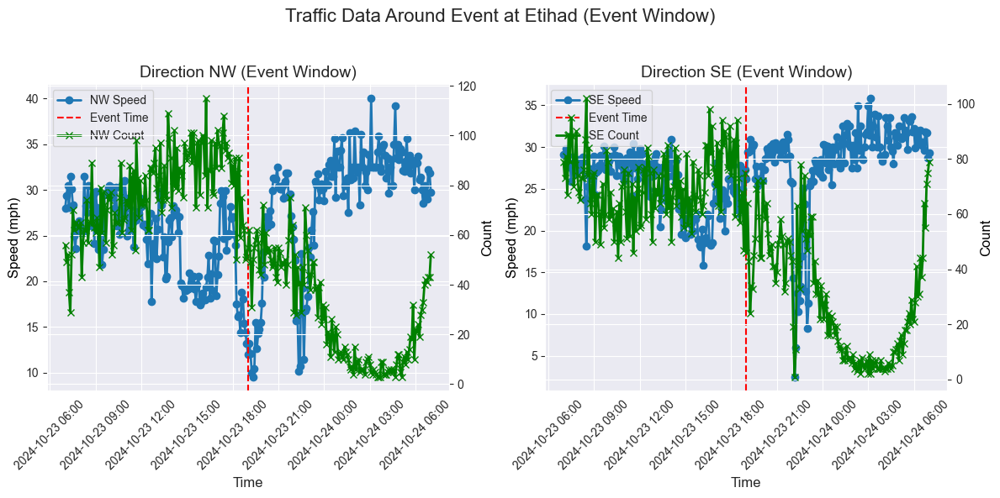

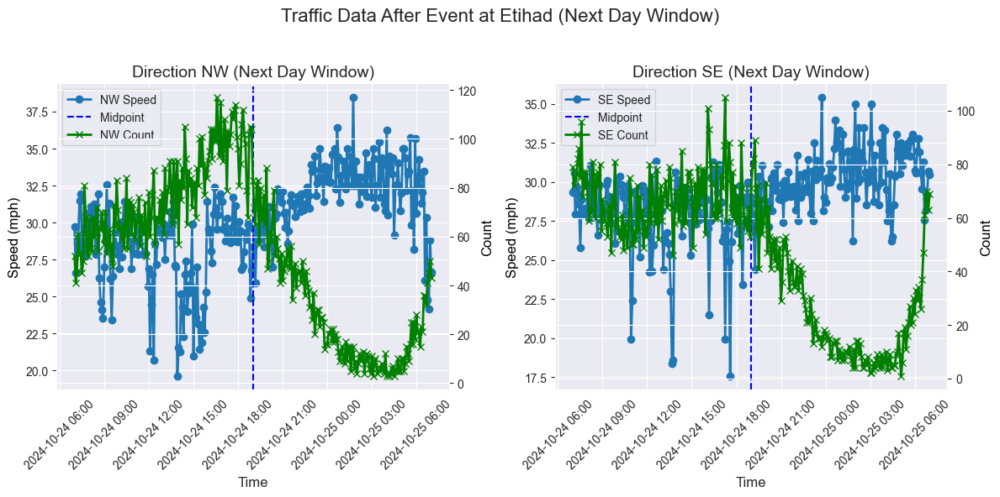

Skipping event at 2024-11-23 17:30:00+00:00 due to incomplete event window data.


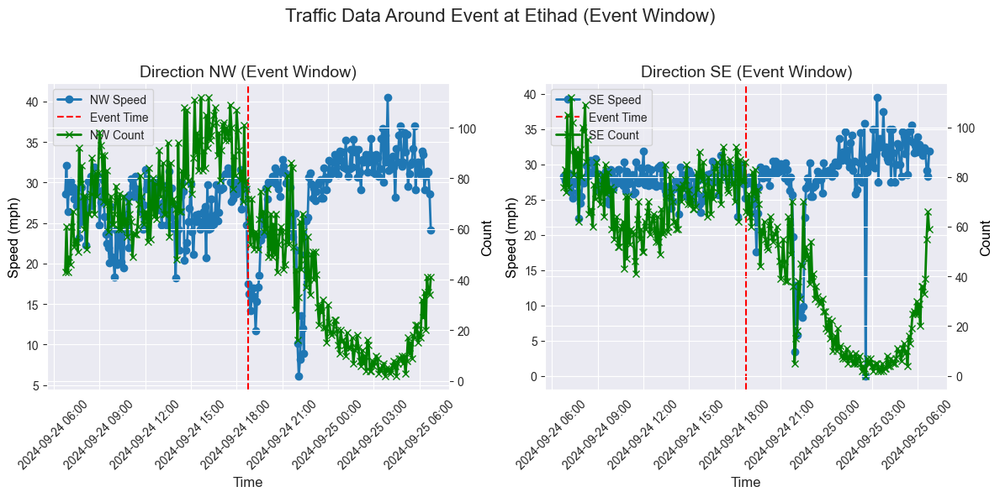

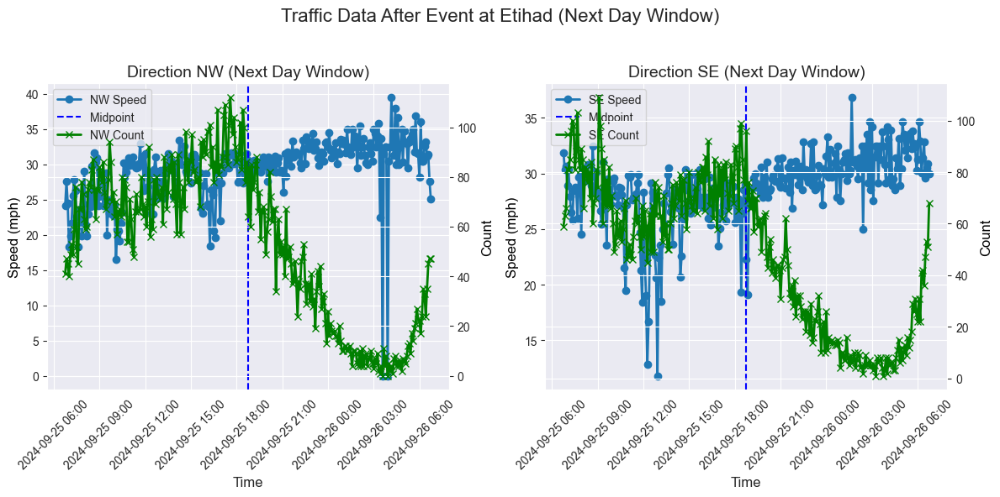

Skipping event at 2025-01-04 15:00:00+00:00 due to incomplete event window data.


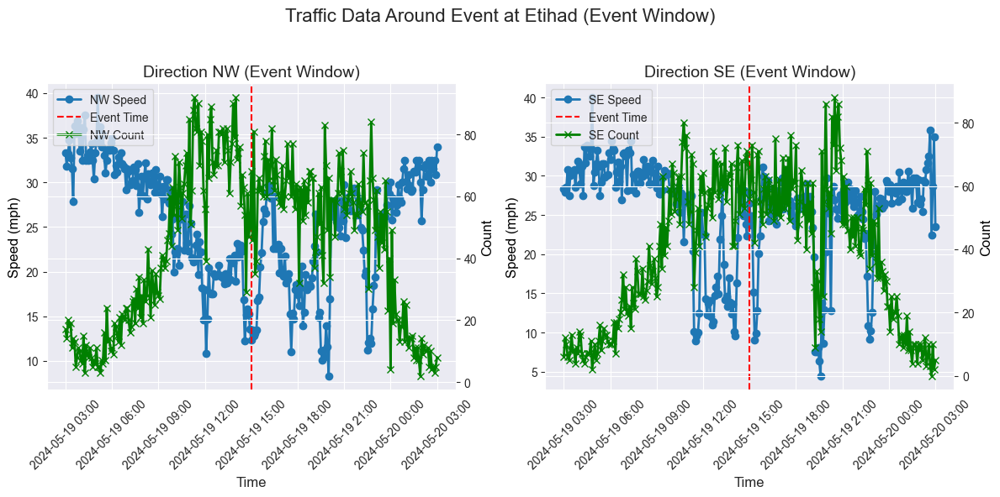

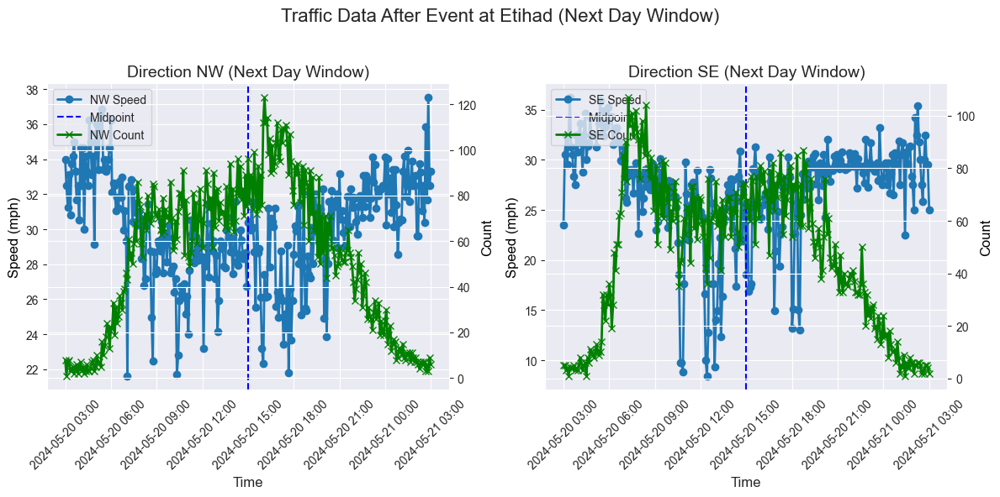

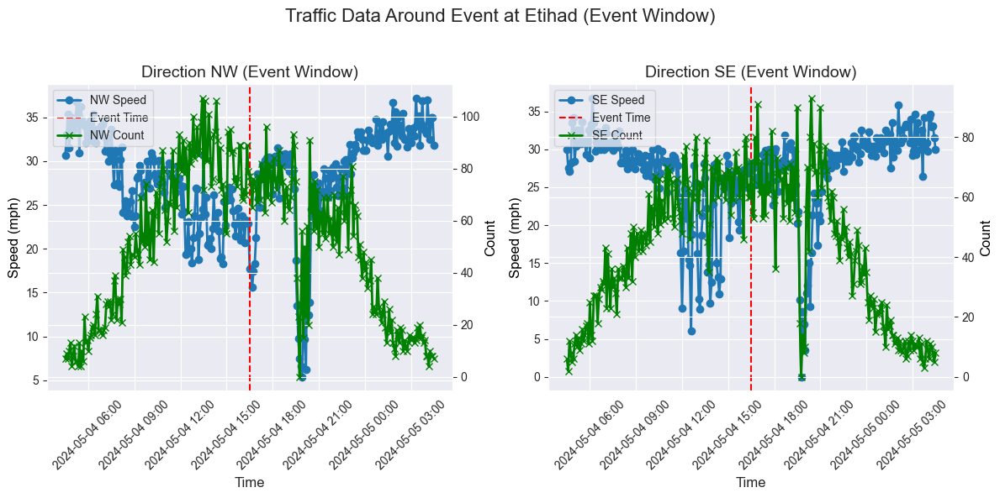

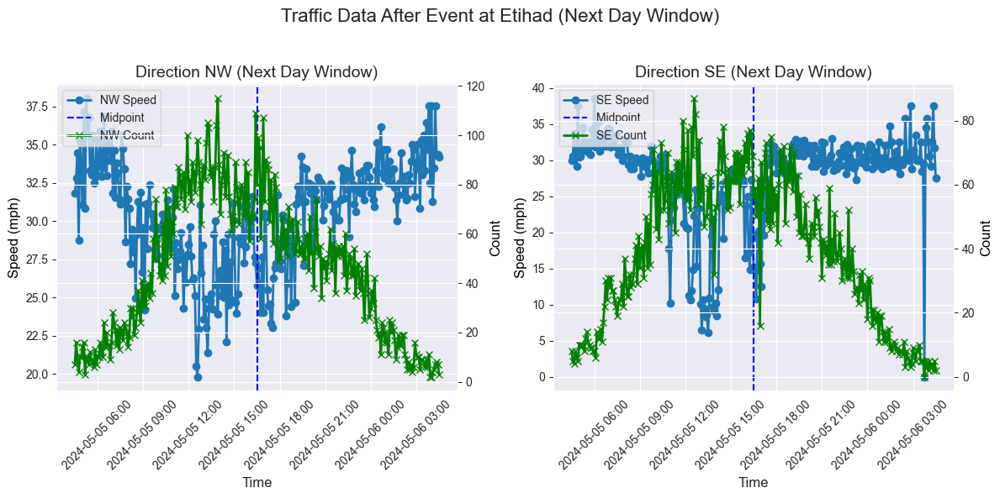

In [10]:
for event_time in event_data.index:
    venue = event_data.loc[event_time, 'venue']

    # Define 12‑hour windows around the event and next day for comparison
    start_time = event_time - pd.Timedelta(hours=12)
    end_time = event_time + pd.Timedelta(hours=12)
    next_day_start = start_time + pd.Timedelta(days=1)
    next_day_end = end_time + pd.Timedelta(days=1)

    speed_event = speed_data[(speed_data.index >= start_time) & (speed_data.index <= end_time)]
    count_event = count_data[(count_data.index >= start_time) & (count_data.index <= end_time)]

    # Check that the event window is fully covered - removing bad data
    if (speed_event.empty or count_event.empty or
        speed_event.index.min() > start_time or speed_event.index.max() < end_time or
        count_event.index.min() > start_time or count_event.index.max() < end_time):
        print(f"Skipping event at {event_time} due to incomplete event window data.")
        continue

    # Same for next day
    speed_next = speed_data[(speed_data.index >= next_day_start) & (speed_data.index <= next_day_end)]
    count_next = count_data[(count_data.index >= next_day_start) & (count_data.index <= next_day_end)]

    if (speed_next.empty or count_next.empty or
        speed_next.index.min() > next_day_start or speed_next.index.max() < next_day_end or
        count_next.index.min() > next_day_start or count_next.index.max() < next_day_end):
        print(f"Skipping event at {event_time} due to incomplete next day window data.")
        continue

    directions = ["nw", "se"]

    # Plot
    n = len(directions)
    # Create one subplot per direction
    fig_event, axs_event = plt.subplots(nrows=1, ncols=n, figsize=(6 * n, 6))
    if n == 1:
        axs_event = [axs_event]

    for i, direction in enumerate(directions):
        ax = axs_event[i]
        ax2 = ax.twinx()

        sp_dir = speed_event[speed_event['sensor_id'] == f"avgspeed_{direction}"]
        cnt_dir = count_event[count_event['sensor_id'] == f"car_{direction}"]

        ax.plot(sp_dir.index, sp_dir['value'],
                marker='o', linewidth=2,
                label=f"{direction.upper()} Speed")
        ax2.plot(cnt_dir.index, cnt_dir['value'],
                 marker='x', linewidth=2, color='green',
                 label=f"{direction.upper()} Count")

        # Mark the event time
        ax.axvline(x=event_time, color='red', linestyle='--', label="Event Time")

        ax.set_title(f"Direction {direction.upper()} (Event Window)", fontsize=14)
        ax.set_xlabel("Time", fontsize=12)
        ax.set_ylabel("Speed (mph)", fontsize=12, color='black')
        ax2.set_ylabel("Count", fontsize=12, color='black')

        ax.xaxis.set_major_formatter(DateFormatter("%Y-%m-%d %H:%M"))
        ax.tick_params(axis='x', rotation=45)

        lines1, labels1 = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax.legend(lines1 + lines2, labels1 + labels2, fontsize=10, loc='upper left')

    fig_event.suptitle(f"Traffic Data Around Event at {venue} (Event Window)", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

    # Next day plot
    fig_next, axs_next = plt.subplots(nrows=1, ncols=n, figsize=(6 * n, 6))
    if n == 1:
        axs_next = [axs_next]
    # Get midpoint of next day window
    midpoint = next_day_start + pd.Timedelta(hours=12)

    for i, direction in enumerate(directions):
        ax = axs_next[i]
        ax2 = ax.twinx()
        sp_dir = speed_next[speed_next['sensor_id'] == f"avgspeed_{direction}"]
        cnt_dir = count_next[count_next['sensor_id'] == f"car_{direction}"]

        ax.plot(sp_dir.index, sp_dir['value'],
                marker='o', linewidth=2,
                label=f"{direction.upper()} Speed")
        ax2.plot(cnt_dir.index, cnt_dir['value'],
                 marker='x', linewidth=2, color='green',
                 label=f"{direction.upper()} Count")

        # Mark the midpoint of the next day window
        ax.axvline(x=midpoint, color='blue', linestyle='--', label="Midpoint")

        ax.set_title(f"Direction {direction.upper()} (Next Day Window)", fontsize=14)
        ax.set_xlabel("Time", fontsize=12)
        ax.set_ylabel("Speed (mph)", fontsize=12, color='black')
        ax2.set_ylabel("Count", fontsize=12, color='black')

        ax.xaxis.set_major_formatter(DateFormatter("%Y-%m-%d %H:%M"))
        ax.tick_params(axis='x', rotation=45)

        lines1, labels1 = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax.legend(lines1 + lines2, labels1 + labels2, fontsize=10, loc='upper left')

    fig_next.suptitle(f"Traffic Data After Event at {venue} (Next Day Window)", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


The plots show the traffic data around each event time and the corresponding time window on the next day. We can observe the following:
- **Traffic Speed**: Speeds tend to decrease gradually before the event time and increase afterward, before decreasing again after a few hours (presumibally when the event ends). This pattern is consistent with traffic congestion around event venues and the dispersal of traffic afterward, giving us a clear indication of the impact and usability for our models.
- **Traffic Count**: Counts show a similar inverted trend, with an increase before the event, a decrease during the event, and a return to normal levels afterward. This is again expected, however the data for traffic counts is less descriptive, less pronounced, and looks to be less useful for our puposes and models, seen as congestion is better modelled from the traffic speed.

We also include plots for the trends on the day after the event. Even though these would be different days (and for sure may even clash with another event), most of the plots allows us to confirm that the trends are not just general trends for the day, but are in fact related to the event.

## 4. Speed vs. Traffic Count Analysis

In this section, we further analyze the relationship between traffic speed and traffic count in general cases, making a decision regarding which metric to use in our models.

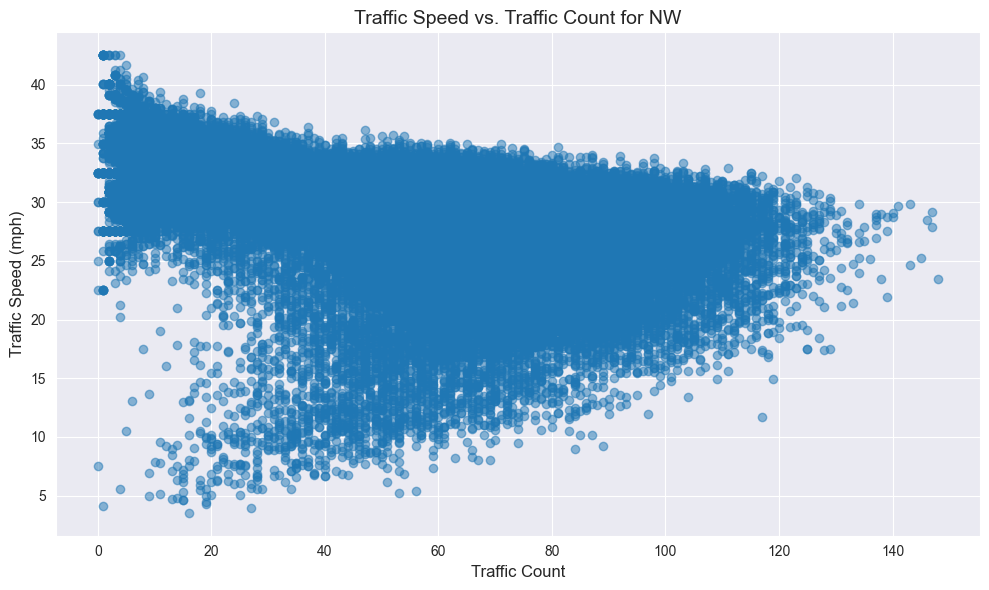

Correlation between traffic count and speed for NW: -0.48



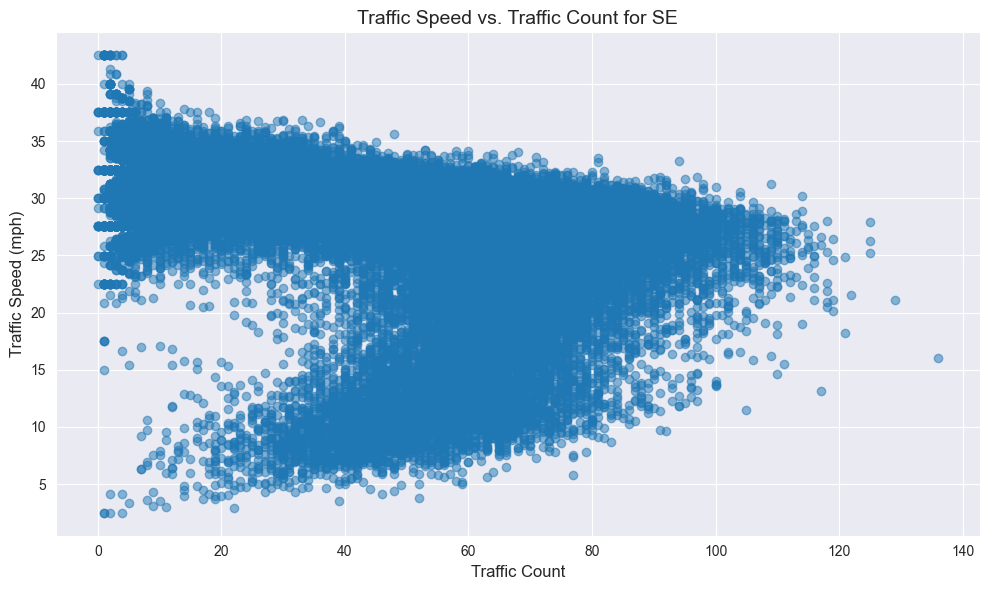

Correlation between traffic count and speed for SE: -0.37



In [29]:
def plot_traffic_for_direction(direction):
    count_sensor = f"car_{direction}"
    speed_sensor = f"avgspeed_{direction}"

    vehicle_counts = (
        count_data[count_data["sensor_id"] == count_sensor]
        .groupby(level=0)["value"]
        .sum()
        .to_frame(name="count_value")
    )

    vehicle_speeds = (
        speed_data[speed_data["sensor_id"] == speed_sensor]
        .groupby(level=0)["value"]
        .mean()
        .to_frame(name="speed_value")
    )

    merged_data = pd.concat([vehicle_counts, vehicle_speeds], axis=1)
    merged_data.dropna(inplace=True)

    # Plot
    plt.figure(figsize=(10, 6))
    plt.scatter(merged_data["count_value"], merged_data["speed_value"], alpha=0.5)
    plt.title(f'Traffic Speed vs. Traffic Count for {direction.upper()}', fontsize=14)
    plt.xlabel('Traffic Count', fontsize=12)
    plt.ylabel('Traffic Speed (mph)', fontsize=12)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Compute and print the correlation coefficient
    correlation = merged_data["count_value"].corr(merged_data["speed_value"])
    print(f"Correlation between traffic count and speed for {direction.upper()}: {correlation:.2f}\n")

for direction in ["nw", "se"]:
    plot_traffic_for_direction(direction)


The plots show the relationship between traffic speed and traffic count for each direction. We also calculate the correlation coefficient between the two metrics.
We can observe the following:
- The plots do in fact show a negative correlation between traffic speed and traffic count, as expected. This indicates our data aligns with typical traffic patterns.
- However, this correlation is not very strong. This is expected, and can be caused by external factors such as weather conditions, roadworks, or accidents, which can affect traffic speed without significantly impacting traffic count.

Due to the nature of this project, reasons given earlier when performing this analysis directly in comparison with events, and given these observations, we will use traffic speed as the main metric in our models, as this is more descriptive and has a clearer relationship with our project goal.